# 1.Business Understanding
## 1.1 Nghiệp vụ
Khách hàng ở đây là một công ty bảo hiểm đã cung cấp bảo hiểm về sức khỏe cho khách hàng và vấn đề ở đây là công ty đang muốn dùng lượng data đó để xác định xem lượng khách hàng ngoài mua bảo hiểm sức khỏe ra thì liệu họ có quan tâm đến bảo hiểm xe cộ của công ty hay không.

Bảo hiểm sức khỏe là loại hình bảo hiểm tự nguyện, giúp chi trả một phần hay toàn bộ chi phí điều trị các các cơ sở y tế (nằm trong danh sách bệnh viện, phòng khám trong hợp đồng) khi người được bảo hiểm bị đau ốm, thương tật, tai nạn, chăm sóc và phục hồi sức khỏe.

Bảo hiểm xe cộ là hàng năm khách hàng cần phải đóng phí bảo hiểm một số tiền nhất định cho công ty cung cấp bảo hiểm để trong trường hợp xe bị tai nạn không may, công ty bảo hiểm sẽ bồi thường (gọi là 'số tiền bảo hiểm') cho khách hàng.
## 1.2 Mục tiêu của dự án
Mục tiêu của dự án đó là sử dụng mô hình dự đoán để đưa ra dự đoán liệu răng khách hàng đã mua bảo hiểm sức khỏe của công ty bảo hiểm thì liệu có bao nhiêu khách hàng có quan tâm đến bảo hiểm xe cộ của công ty bảo hiểm
## 1.3 Các tiêu chí để đánh giá mô hình
Đối với bài toán phân loại trong dự án này tôi sẽ sử dụng các tiêu chí sau để đánh giá đó là: Precision, Recall, F1_score và ROC_AUC.

# Tải dữ liệu, giải nén và các thư viện liên quan

In [3]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
!unzip /content/drive/MyDrive/DATN_DSP305x/archive.zip -d /content/drive/MyDrive/DATN_DSP305x/unzip_data

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.calibration import calibration_curve, CalibratedClassifierCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, f1_score
from sklearn.datasets import make_classification
from sklearn.svm import LinearSVC

from imblearn.pipeline import make_pipeline
from imblearn.over_sampling import RandomOverSampler
from imblearn.base import BaseSampler

from imblearn.over_sampling import SMOTE

from sklearn.linear_model import LogisticRegression

from sklearn.svm import LinearSVC


from tensorflow.keras.models import Model


import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [7]:
from sklearn.metrics import f1_score, roc_auc_score, accuracy_score, confusion_matrix, precision_score, recall_score, roc_curve, average_precision_score, precision_recall_curve

# 2.Data understanding
## 2.1 Data DESCRIPTION

##Về định dạng của dữ liệu
Dữ liệu ở đây là dạng bảng, bao gồm 12 cột thuộc tính và 381109 hàng.
## Danh tính của các trường và các đặc trưng của dữ liệu
*   ID: mỗi id đại diện cho một khách hàng, và các id không trùng nhau
*   Gender: Giới tính của khách hàng
*   Age: Tuổi của khách hàng
*   Driving_License: 0-Khách hàng không có GPLX, 1-KH có GPLX
*   Region_Code: Mã vùng của khách hàng
*   Previously_Insured: 0-KH chưa có bảo hiểm, 1-KH đã có bảo hiểm
*   Vehicle_Age: Tuổi của phương tiện
*   Vehicle_Damage: 0-Phương tiện đã bị hỏng, 1-Phương tiện chưa bị hỏng
*   Annual_Premium: Số tiền bảo hiểm KH trả hàng năm
*   Policy_Sales_Channel: Mã code cho kênh tiếp cận khách hàng như tiếp cận qua mail, điện thoại...
*   Vintage: Số ngày khách hàng đã liên kết với công ty
*   Response: 0-KH không quan tâm đến bảo hiểm, 1-KH quan tâm đến bảo hiểm.








In [8]:
df_train= pd.read_csv('/content/drive/MyDrive/DATN_DSP305x/unzip_data/train.csv')

In [9]:
df_train.shape

(381109, 12)

In [10]:
df_train.head(5)

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,Male,44,1,28.0,0,> 2 Years,Yes,40454.0,26.0,217,1
1,2,Male,76,1,3.0,0,1-2 Year,No,33536.0,26.0,183,0
2,3,Male,47,1,28.0,0,> 2 Years,Yes,38294.0,26.0,27,1
3,4,Male,21,1,11.0,1,< 1 Year,No,28619.0,152.0,203,0
4,5,Female,29,1,41.0,1,< 1 Year,No,27496.0,152.0,39,0


In [11]:
df_train.tail(5)

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
381104,381105,Male,74,1,26.0,1,1-2 Year,No,30170.0,26.0,88,0
381105,381106,Male,30,1,37.0,1,< 1 Year,No,40016.0,152.0,131,0
381106,381107,Male,21,1,30.0,1,< 1 Year,No,35118.0,160.0,161,0
381107,381108,Female,68,1,14.0,0,> 2 Years,Yes,44617.0,124.0,74,0
381108,381109,Male,46,1,29.0,0,1-2 Year,No,41777.0,26.0,237,0


# 2.2 Exploratory Data Analysis - EDA (Phân tích dữ liệu khám phá)

In [12]:
df_train.describe(include='all')
# sử dụng include = 'all' để áp dụng cho cả các biến phân loại

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
count,381109.000000,381109,381109.000000,381109.000000,381109.000000,381109.000000,381109,381109,381109.000000,381109.000000,381109.000000,381109.000000
unique,NaN,2,NaN,NaN,NaN,NaN,3,2,NaN,NaN,NaN,NaN
top,NaN,Male,NaN,NaN,NaN,NaN,1-2 Year,Yes,NaN,NaN,NaN,NaN
freq,NaN,206089,NaN,NaN,NaN,NaN,200316,192413,NaN,NaN,NaN,NaN
mean,190555.000000,NaN,38.822584,0.997869,26.388807,0.458210,NaN,NaN,30564.389581,112.034295,154.347397,0.122563
std,110016.836208,NaN,15.511611,0.046110,13.229888,0.498251,NaN,NaN,17213.155057,54.203995,83.671304,0.327936
min,1.000000,NaN,20.000000,0.000000,0.000000,0.000000,NaN,NaN,2630.000000,1.000000,10.000000,0.000000
25%,95278.000000,NaN,25.000000,1.000000,15.000000,0.000000,NaN,NaN,24405.000000,29.000000,82.000000,0.000000
50%,190555.000000,NaN,36.000000,1.000000,28.000000,0.000000,NaN,NaN,31669.000000,133.000000,154.000000,0.000000
75%,285832.000000,NaN,49.000000,1.000000,35.000000,1.000000,NaN,NaN,39400.000000,152.000000,227.000000,0.000000


## Kiểm tra data có bị missing data hay không

In [13]:
df_train.info()
# với df_train.info() ta có thể thấy tập data mà tôi dùng không có gì null nào

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 381109 entries, 0 to 381108
Data columns (total 12 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    381109 non-null  int64  
 1   Gender                381109 non-null  object 
 2   Age                   381109 non-null  int64  
 3   Driving_License       381109 non-null  int64  
 4   Region_Code           381109 non-null  float64
 5   Previously_Insured    381109 non-null  int64  
 6   Vehicle_Age           381109 non-null  object 
 7   Vehicle_Damage        381109 non-null  object 
 8   Annual_Premium        381109 non-null  float64
 9   Policy_Sales_Channel  381109 non-null  float64
 10  Vintage               381109 non-null  int64  
 11  Response              381109 non-null  int64  
dtypes: float64(3), int64(6), object(3)
memory usage: 34.9+ MB


In [14]:
df_train['Gender'].value_counts()

Male      206089
Female    175020
Name: Gender, dtype: int64

Text(0.5, 1.0, 'Gender_of_data')

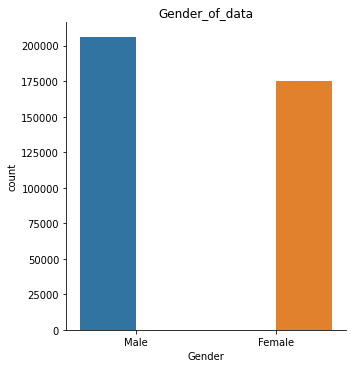

In [15]:
sns.catplot(x="Gender", hue="Gender",
                data=df_train, kind="count",
                height=5, aspect=1)
plt.title('Gender_of_data')
# Đối với tập data 

In [16]:
df_train['Age'].value_counts()

24    25960
23    24256
22    20964
25    20636
21    16457
      ...  
81       56
82       29
83       22
84       11
85       11
Name: Age, Length: 66, dtype: int64

In [17]:
fig = px.histogram(df_train, x='Age',height=500, width=800)
fig.show()

## Ta có thể thấy độ tuổi chiếm lượng lướn là độ tuổi từ 21-26 tuổi

In [18]:
df_train['Region_Code'].value_counts()

28.0    106415
8.0      33877
46.0     19749
41.0     18263
15.0     13308
30.0     12191
29.0     11065
50.0     10243
3.0       9251
11.0      9232
36.0      8797
33.0      7654
47.0      7436
35.0      6942
6.0       6280
45.0      5605
37.0      5501
18.0      5153
48.0      4681
14.0      4678
39.0      4644
10.0      4374
21.0      4266
2.0       4038
13.0      4036
7.0       3279
12.0      3198
9.0       3101
27.0      2823
32.0      2787
43.0      2639
17.0      2617
26.0      2587
25.0      2503
24.0      2415
38.0      2026
0.0       2021
16.0      2007
31.0      1960
23.0      1960
20.0      1935
49.0      1832
4.0       1801
34.0      1664
19.0      1535
22.0      1309
40.0      1295
5.0       1279
1.0       1008
44.0       808
42.0       591
52.0       267
51.0       183
Name: Region_Code, dtype: int64

## Mã vùng 28 là nơi có nhiều người tham gia bảo hiểm nhất

In [19]:
fig = px.histogram(df_train, x='Region_Code')
fig.update_layout(height=500, width=500,
                  title_text="Region_Code distribution")
fig.show()

## Như đã nói ở trên với data của cột Driving_License thì ta có thể bỏ được để giảm độ phức tạp của mô hình mà không ảnh hưởng nghiệm trọng đến kết quả của mô hình

In [20]:
df_train['Driving_License'].value_counts()
# Với cột Drving_License ta có thể không cần dùng khi train model vì hầu như tập data đều có giấy phép lái xe và có rất ít là không có giấy phép lái xe

1    380297
0       812
Name: Driving_License, dtype: int64

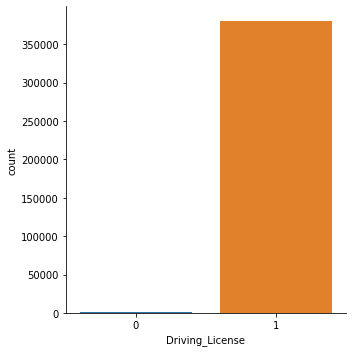

In [21]:
sns.catplot(data=df_train,x='Driving_License',kind='count')

In [22]:
df_train['Vehicle_Age'].value_counts()

1-2 Year     200316
< 1 Year     164786
> 2 Years     16007
Name: Vehicle_Age, dtype: int64

Text(0.5, 1.0, 'Vehicle_Age_count')

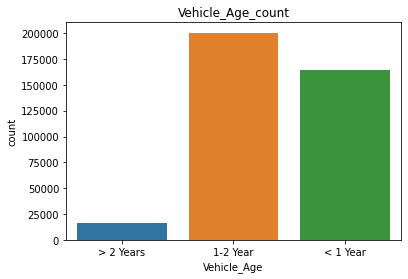

In [23]:
sns.countplot(data=df_train, x='Vehicle_Age')
plt.title('Vehicle_Age_count')

In [24]:
df_train['Vehicle_Damage'].value_counts()

Yes    192413
No     188696
Name: Vehicle_Damage, dtype: int64

Text(0.5, 1.0, 'Vehicle_Damage_count')

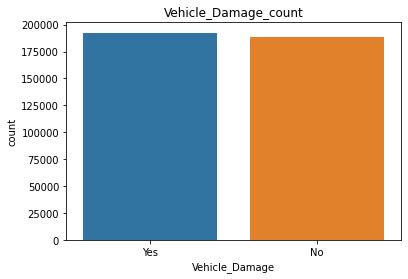

In [25]:
sns.countplot(data=df_train, x='Vehicle_Damage')
plt.title('Vehicle_Damage_count')

In [26]:
df_train['Previously_Insured'].value_counts()

0    206481
1    174628
Name: Previously_Insured, dtype: int64

Text(0.5, 1.0, 'Previously_Insured_count')

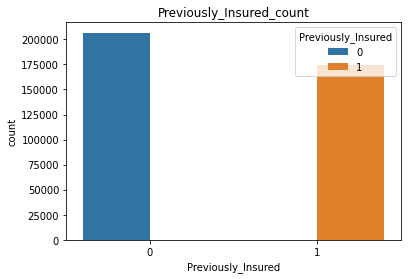

In [27]:
sns.countplot(data=df_train, x='Previously_Insured',hue='Previously_Insured')
plt.title('Previously_Insured_count')

In [28]:
df_train['Annual_Premium'].value_counts()

2630.0      64877
69856.0       140
39008.0        41
38287.0        38
45179.0        38
            ...  
14838.0         1
52535.0         1
15182.0         1
143525.0        1
69845.0         1
Name: Annual_Premium, Length: 48838, dtype: int64

Text(0.5, 1.0, 'Annual_premium_distribution')

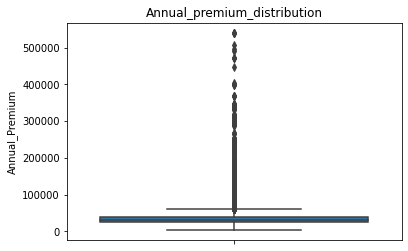

In [29]:
sns.boxplot(data=df_train, y='Annual_Premium')
plt.title('Annual_premium_distribution')

In [30]:
df_train['Policy_Sales_Channel'].value_counts()

152.0    134784
26.0      79700
124.0     73995
160.0     21779
156.0     10661
          ...  
149.0         1
43.0          1
144.0         1
143.0         1
41.0          1
Name: Policy_Sales_Channel, Length: 155, dtype: int64

In [31]:
fig = px.histogram(df_train, x='Policy_Sales_Channel')
fig.update_layout(height=500, width=1000,
                  title_text="Policy_Sales_Channel distribution")
fig.show()
# Kênh bán hàng ở đât chủ yếu là kênh 28

In [32]:
df_train['Vintage'].value_counts()

256    1418
73     1410
282    1397
158    1394
187    1392
       ... 
205    1235
89     1234
32     1230
224    1227
277    1226
Name: Vintage, Length: 290, dtype: int64

Text(0.5, 1.0, 'Vintage_distribution')

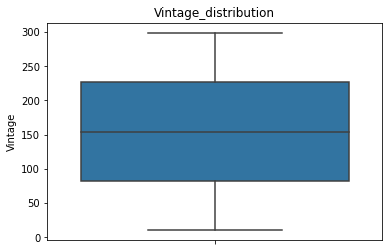

In [33]:
sns.boxplot(data=df_train, y='Vintage')
plt.title('Vintage_distribution')

In [34]:
df_train['Response'].value_counts()

0    334399
1     46710
Name: Response, dtype: int64

Text(0.5, 1.0, 'Response_count')

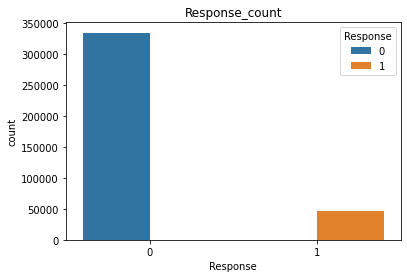

In [35]:
sns.countplot(data=df_train, x='Response',hue='Response')
plt.title('Response_count')

## Kiểm tra qua các đặc trưng so với output của vấn đề là Response

In [36]:
df_train

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,Male,44,1,28.0,0,> 2 Years,Yes,40454.0,26.0,217,1
1,2,Male,76,1,3.0,0,1-2 Year,No,33536.0,26.0,183,0
2,3,Male,47,1,28.0,0,> 2 Years,Yes,38294.0,26.0,27,1
3,4,Male,21,1,11.0,1,< 1 Year,No,28619.0,152.0,203,0
4,5,Female,29,1,41.0,1,< 1 Year,No,27496.0,152.0,39,0
...,...,...,...,...,...,...,...,...,...,...,...,...
381104,381105,Male,74,1,26.0,1,1-2 Year,No,30170.0,26.0,88,0
381105,381106,Male,30,1,37.0,1,< 1 Year,No,40016.0,152.0,131,0
381106,381107,Male,21,1,30.0,1,< 1 Year,No,35118.0,160.0,161,0
381107,381108,Female,68,1,14.0,0,> 2 Years,Yes,44617.0,124.0,74,0


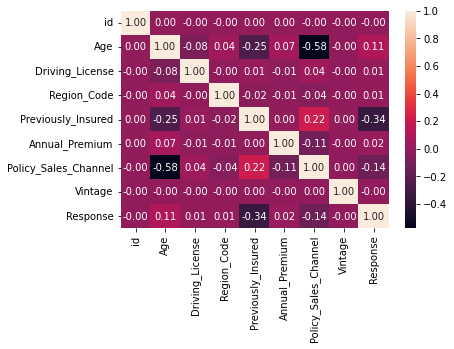

In [37]:
sns.heatmap(df_train.corr(),annot=True, fmt=".2f")

## Sau khi kiểm tra các đặc trưng của data và từ biểu đồ thể hiện sự tương quan tuyến tính Correlation ta có thể bỏ đi cột ID, Drving_Lincense, Vintage, Region_code. Tuy nhiên khi chúng ta có thể thấy về khía cạnh kinh tế thì chỉ nên bỏ đi cột ID, và cột Driving_License.
## Côt Vintage thể hiện thời gian khách hàng gắn bó. Từ thời gian lâu hay ngắn chúng ta có thể có dữ liệu khách hàng nào đó thực sự mua bảo hiểm.


# Phân tích một số đặc trưng với Output Response của data

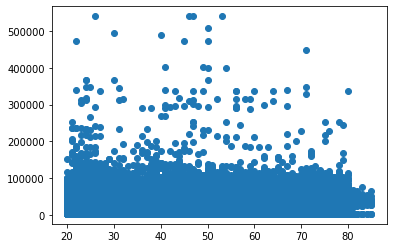

In [38]:
plt.scatter(data=df_train,x='Age',y='Annual_Premium')

In [39]:
# df include response = 1
positive = df_train[df_train['Response']==1]
# df include response = 0
negative = df_train[df_train['Response']==0]

In [40]:
count_1_by_v_age = positive.groupby(['Vehicle_Age'],as_index=False).count()
count_0_by_v_age = negative.groupby(['Vehicle_Age'],as_index=False).count()

In [41]:

v_age_count_1 = positive.groupby(['Vehicle_Age'],as_index=False).count()[['Vehicle_Age','Response']]
v_age_count_0 = negative.groupby(['Vehicle_Age'],as_index=False).count()[['Vehicle_Age','Response']]

In [42]:
v_age_count_1

,Vehicle_Age,Response
0,1-2 Year,34806
1,< 1 Year,7202
2,> 2 Years,4702


In [43]:
v_age_count_0

,Vehicle_Age,Response
0,1-2 Year,165510
1,< 1 Year,157584
2,> 2 Years,11305


In [44]:

fig = make_subplots(rows=1, cols=2)

fig.add_trace(
    go.Bar(x=v_age_count_1['Vehicle_Age'], y=v_age_count_1['Response'], name='Interested'),
    row=1, col=1
)

fig.add_trace(
    go.Bar(x=v_age_count_0['Vehicle_Age'], y=v_age_count_0['Response'], name='Not interested'),
    row=1, col=2
)

fig.update_layout(height=600, width=800, title_text="\"Interested\" vs \"Not interested\" Vehicle_Age")
fig.show()

In [45]:
fig = go.Figure(data=[
    go.Bar(x=v_age_count_1['Vehicle_Age'], y=v_age_count_1['Response'], name='Interested'),
    go.Bar(x=v_age_count_0['Vehicle_Age'], y=v_age_count_0['Response'], name='Not Interested')
])
# Change the bar mode
fig.update_layout(barmode='stack', title_text="Vehicle_Age")
fig.show()

Text(0.5, 1.0, 'Annual_Premium (Not Interested)')

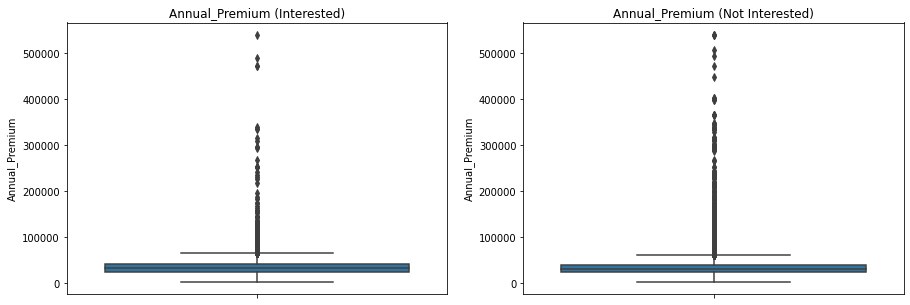

In [46]:
fig, ax = plt.subplots(1,2,figsize=(15,5))
sns.boxplot(data=positive, y='Annual_Premium', ax=ax[0])
ax[0].set_title('Annual_Premium (Interested)')

sns.boxplot(data=negative, y='Annual_Premium', ax=ax[1])
ax[1].set_title('Annual_Premium (Not Interested)')

In [47]:
fig = make_subplots(rows=1, cols=2)

fig.add_trace(
    go.Histogram(x=positive['Region_Code'], name='Interested'),
    row=1, col=1
)

fig.add_trace(
    go.Histogram(x=negative['Region_Code'], name='Not interested'),
    row=1, col=2
)

fig.update_layout(height=600, width=800, title_text="\"Interested\" vs \"Not interested\" Region_Code")
fig.show()

Text(0.5, 1.0, 'Gender_count (Not Interested)')

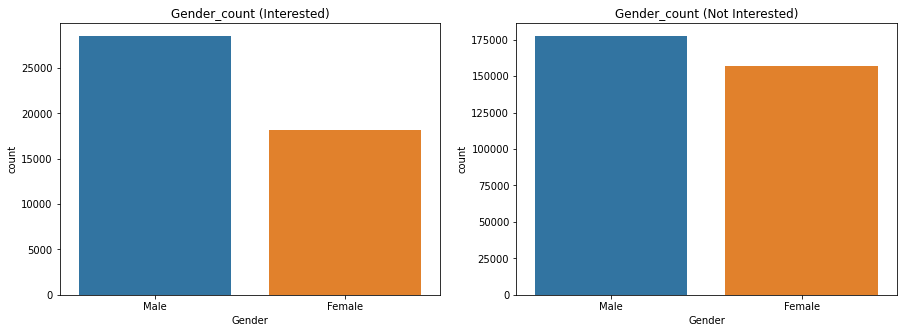

In [48]:
fig, ax = plt.subplots(1,2,figsize=(15,5))
sns.countplot(data=positive, x='Gender', ax=ax[0])
ax[0].set_title('Gender_count (Interested)')

sns.countplot(data=negative, x='Gender', ax=ax[1])
ax[1].set_title('Gender_count (Not Interested)')

Text(0.5, 1.0, 'Previously_Insured_count (Not Interested)')

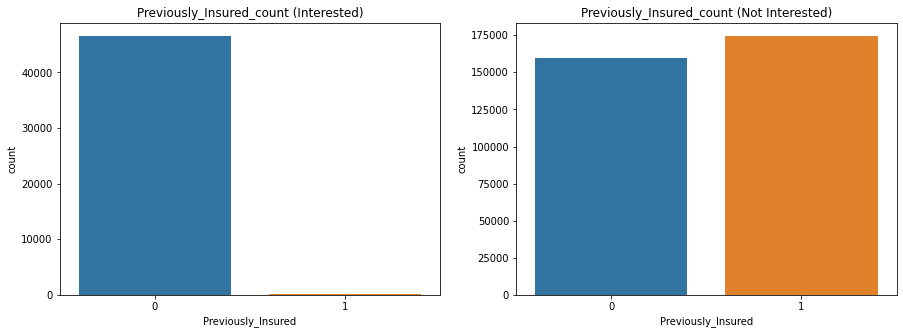

In [49]:
fig, ax = plt.subplots(1,2,figsize=(15,5))
sns.countplot(data=positive, x='Previously_Insured', ax=ax[0])
ax[0].set_title('Previously_Insured_count (Interested)')

sns.countplot(data=negative, x='Previously_Insured', ax=ax[1])
ax[1].set_title('Previously_Insured_count (Not Interested)')

Text(0.5, 1.0, 'Vehicle_Damage_count (0)')

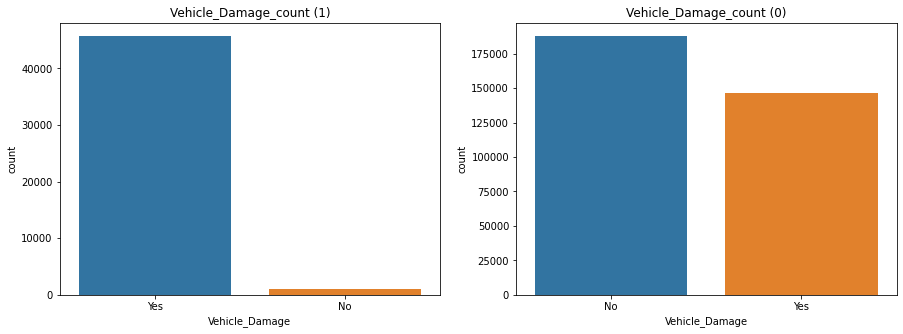

In [50]:
fig, ax = plt.subplots(1,2,figsize=(15,5))
sns.countplot(data=positive, x='Vehicle_Damage', ax=ax[0])
ax[0].set_title('Vehicle_Damage_count (1)')

sns.countplot(data=negative, x='Vehicle_Damage', ax=ax[1])
ax[1].set_title('Vehicle_Damage_count (0)')

In [51]:
fig = make_subplots(rows=1, cols=2)

fig.add_trace(
    go.Histogram(x=positive['Age'], name='Interested'),
    row=1, col=1
)

fig.add_trace(
    go.Histogram(x=negative['Age'], name='Not interested'),
    row=1, col=2
)

fig.update_layout(height=600, width=800, title_text="1 vs 0 Age distribution")
fig.show()

In [52]:
fig = px.histogram(df_train, x='Vintage', color='Response')
fig.update_layout(height=500, width=500,
                  title_text="Vintage/Respones_distribution")
fig.show()

In [53]:
fig = make_subplots(rows=1, cols=2)

fig.add_trace(
    go.Histogram(x=positive['Policy_Sales_Channel'], name='Interested'),
    row=1, col=1
)

fig.add_trace(
    go.Histogram(x=negative['Policy_Sales_Channel'], name='Not interested'),
    row=1, col=2
)

fig.update_layout(height=600, width=800, title_text="1 vs 0 Policy_Sales_channel distribution")
fig.show()

# 3. Data Preparation

In [54]:
df_train

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,Male,44,1,28.0,0,> 2 Years,Yes,40454.0,26.0,217,1
1,2,Male,76,1,3.0,0,1-2 Year,No,33536.0,26.0,183,0
2,3,Male,47,1,28.0,0,> 2 Years,Yes,38294.0,26.0,27,1
3,4,Male,21,1,11.0,1,< 1 Year,No,28619.0,152.0,203,0
4,5,Female,29,1,41.0,1,< 1 Year,No,27496.0,152.0,39,0
...,...,...,...,...,...,...,...,...,...,...,...,...
381104,381105,Male,74,1,26.0,1,1-2 Year,No,30170.0,26.0,88,0
381105,381106,Male,30,1,37.0,1,< 1 Year,No,40016.0,152.0,131,0
381106,381107,Male,21,1,30.0,1,< 1 Year,No,35118.0,160.0,161,0
381107,381108,Female,68,1,14.0,0,> 2 Years,Yes,44617.0,124.0,74,0


In [55]:
df_train = pd.get_dummies(df_train, columns=['Gender'],drop_first=True)

In [56]:
df_train

,id,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response,Gender_Male
0,1,44,1,28.0,0,> 2 Years,Yes,40454.0,26.0,217,1,1
1,2,76,1,3.0,0,1-2 Year,No,33536.0,26.0,183,0,1
2,3,47,1,28.0,0,> 2 Years,Yes,38294.0,26.0,27,1,1
3,4,21,1,11.0,1,< 1 Year,No,28619.0,152.0,203,0,1
4,5,29,1,41.0,1,< 1 Year,No,27496.0,152.0,39,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
381104,381105,74,1,26.0,1,1-2 Year,No,30170.0,26.0,88,0,1
381105,381106,30,1,37.0,1,< 1 Year,No,40016.0,152.0,131,0,1
381106,381107,21,1,30.0,1,< 1 Year,No,35118.0,160.0,161,0,1
381107,381108,68,1,14.0,0,> 2 Years,Yes,44617.0,124.0,74,0,0


In [57]:
df_train = pd.get_dummies(df_train, columns=['Vehicle_Damage'],drop_first=True)

In [58]:
df_train

,id,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Annual_Premium,Policy_Sales_Channel,Vintage,Response,Gender_Male,Vehicle_Damage_Yes
0,1,44,1,28.0,0,> 2 Years,40454.0,26.0,217,1,1,1
1,2,76,1,3.0,0,1-2 Year,33536.0,26.0,183,0,1,0
2,3,47,1,28.0,0,> 2 Years,38294.0,26.0,27,1,1,1
3,4,21,1,11.0,1,< 1 Year,28619.0,152.0,203,0,1,0
4,5,29,1,41.0,1,< 1 Year,27496.0,152.0,39,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
381104,381105,74,1,26.0,1,1-2 Year,30170.0,26.0,88,0,1,0
381105,381106,30,1,37.0,1,< 1 Year,40016.0,152.0,131,0,1,0
381106,381107,21,1,30.0,1,< 1 Year,35118.0,160.0,161,0,1,0
381107,381108,68,1,14.0,0,> 2 Years,44617.0,124.0,74,0,0,1


In [59]:

df_train.loc[df_train['Vehicle_Age'] == '> 2 Years', 'Vehicle_Age'] = 2
df_train.loc[df_train['Vehicle_Age'] == '1-2 Year', 'Vehicle_Age'] = 1
df_train.loc[df_train['Vehicle_Age'] == '< 1 Year', 'Vehicle_Age'] = 0

In [60]:
df_train

,id,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Annual_Premium,Policy_Sales_Channel,Vintage,Response,Gender_Male,Vehicle_Damage_Yes
0,1,44,1,28.0,0,2,40454.0,26.0,217,1,1,1
1,2,76,1,3.0,0,1,33536.0,26.0,183,0,1,0
2,3,47,1,28.0,0,2,38294.0,26.0,27,1,1,1
3,4,21,1,11.0,1,0,28619.0,152.0,203,0,1,0
4,5,29,1,41.0,1,0,27496.0,152.0,39,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
381104,381105,74,1,26.0,1,1,30170.0,26.0,88,0,1,0
381105,381106,30,1,37.0,1,0,40016.0,152.0,131,0,1,0
381106,381107,21,1,30.0,1,0,35118.0,160.0,161,0,1,0
381107,381108,68,1,14.0,0,2,44617.0,124.0,74,0,0,1


In [61]:
df_train.drop('id',axis=1,inplace=True)

In [62]:
df_train.drop('Driving_License',axis=1,inplace=True)


In [63]:
df_train

,Age,Region_Code,Previously_Insured,Vehicle_Age,Annual_Premium,Policy_Sales_Channel,Vintage,Response,Gender_Male,Vehicle_Damage_Yes
0,44,28.0,0,2,40454.0,26.0,217,1,1,1
1,76,3.0,0,1,33536.0,26.0,183,0,1,0
2,47,28.0,0,2,38294.0,26.0,27,1,1,1
3,21,11.0,1,0,28619.0,152.0,203,0,1,0
4,29,41.0,1,0,27496.0,152.0,39,0,0,0
...,...,...,...,...,...,...,...,...,...,...
381104,74,26.0,1,1,30170.0,26.0,88,0,1,0
381105,30,37.0,1,0,40016.0,152.0,131,0,1,0
381106,21,30.0,1,0,35118.0,160.0,161,0,1,0
381107,68,14.0,0,2,44617.0,124.0,74,0,0,1


In [64]:
y = df_train['Response']

In [65]:
df_train.drop('Response',axis=1,inplace=True)

In [66]:
df_train

,Age,Region_Code,Previously_Insured,Vehicle_Age,Annual_Premium,Policy_Sales_Channel,Vintage,Gender_Male,Vehicle_Damage_Yes
0,44,28.0,0,2,40454.0,26.0,217,1,1
1,76,3.0,0,1,33536.0,26.0,183,1,0
2,47,28.0,0,2,38294.0,26.0,27,1,1
3,21,11.0,1,0,28619.0,152.0,203,1,0
4,29,41.0,1,0,27496.0,152.0,39,0,0
...,...,...,...,...,...,...,...,...,...
381104,74,26.0,1,1,30170.0,26.0,88,1,0
381105,30,37.0,1,0,40016.0,152.0,131,1,0
381106,21,30.0,1,0,35118.0,160.0,161,1,0
381107,68,14.0,0,2,44617.0,124.0,74,0,1


In [67]:
df_train.corr()

,Age,Region_Code,Previously_Insured,Annual_Premium,Policy_Sales_Channel,Vintage,Gender_Male,Vehicle_Damage_Yes
Age,1.000000,0.042574,-0.254682,0.067507,-0.577826,-0.001264,0.145545,0.267534
Region_Code,0.042574,1.000000,-0.024659,-0.010588,-0.042420,-0.002750,0.000604,0.028235
Previously_Insured,-0.254682,-0.024659,1.000000,0.004269,0.219381,0.002537,-0.081932,-0.824143
Annual_Premium,0.067507,-0.010588,0.004269,1.000000,-0.113247,-0.000608,0.003673,0.009349
Policy_Sales_Channel,-0.577826,-0.042420,0.219381,-0.113247,1.000000,0.000002,-0.111159,-0.224377
Vintage,-0.001264,-0.002750,0.002537,-0.000608,0.000002,1.000000,-0.002517,-0.002064
Gender_Male,0.145545,0.000604,-0.081932,0.003673,-0.111159,-0.002517,1.000000,0.091606
Vehicle_Damage_Yes,0.267534,0.028235,-0.824143,0.009349,-0.224377,-0.002064,0.091606,1.000000


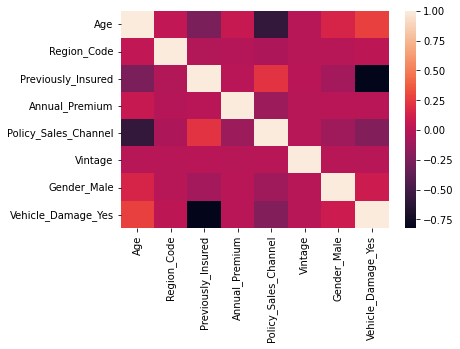

In [68]:
sns.heatmap(df_train.corr())

In [69]:
scaler = MinMaxScaler()
df_train[['Age','Annual_Premium','Vintage']] = scaler.fit_transform(df_train[['Age','Annual_Premium','Vintage']])
# splitting data with test_size of 0.25
X_train, X_test, y_train, y_test = train_test_split(df_train, y, test_size=0.25, random_state=42)

In [70]:
X_train

,Age,Region_Code,Previously_Insured,Vehicle_Age,Annual_Premium,Policy_Sales_Channel,Vintage,Gender_Male,Vehicle_Damage_Yes
247288,0.015385,46.0,1,0,0.040749,152.0,0.664360,1,0
88242,0.846154,28.0,1,1,0.463641,124.0,0.259516,0,1
312678,0.476923,28.0,0,1,0.124589,124.0,0.494810,1,1
218264,0.030769,29.0,1,0,0.068727,152.0,0.117647,1,0
88838,0.046154,21.0,1,0,0.046124,152.0,0.685121,1,0
...,...,...,...,...,...,...,...,...,...
259178,0.061538,36.0,1,0,0.037105,152.0,0.958478,0,0
365838,0.553846,35.0,0,1,0.071915,124.0,0.996540,1,1
131932,0.030769,2.0,0,0,0.030188,152.0,0.228374,0,1
146867,0.369231,32.0,1,1,0.000000,156.0,0.141869,1,1


In [71]:
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(285831, 9) (95278, 9) (285831,) (95278,)


# 4.Modeling

## 4.1 Modeling với data ban đầu

# Logistic Regression

In [72]:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, StratifiedKFold, KFold, cross_val_score

## Sủ dụng RandomizedSearchCV để tìm thông số tốt nhất cho model 

In [73]:
model_LR = LogisticRegression()
params = {'C': [C for C in np.linspace(0.01, 0.5, 5)], 
    'solver': ['newton-cg', 'lbfgs', 'liblinear'], 
    'max_iter': [100, 150, 200]}

search = RandomizedSearchCV(estimator = model_LR, 
                            param_distributions = params, 
                            n_iter=10, cv=3, 
                            n_jobs=-1, 
                            verbose=1, 
                            random_state=9)
search.fit(X_train, y_train)

print('best of params', search.best_params_)
best_params = search.best_params_
model_LR = LogisticRegression(penalty='l2',tol=0.0001,fit_intercept=True,class_weight=None,**best_params)

Fitting 3 folds for each of 10 candidates, totalling 30 fits
best of params {'solver': 'lbfgs', 'max_iter': 200, 'C': 0.01}


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [74]:
model_LR = LogisticRegression(penalty='l2',tol=0.0001,fit_intercept=True,class_weight=None,**best_params)

In [75]:
model_LR.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression(C=0.01, max_iter=200)

In [76]:
y_score_LR = model_LR.predict_proba(X_test)
y_pred_LR = y_score_LR[:, 1] > 0.5
y_pred_LR = y_pred_LR.astype('int')

# evaluation metric
Roc_Auc_score_LR = roc_auc_score(y_test, y_score_LR[:, 1])
f1_LR = f1_score(y_test, y_pred_LR)
precision_LR = precision_score(y_test, y_pred_LR)
recall_LR = recall_score(y_test, y_pred_LR)
fpr_LR, tpr_LR, thresholds_LR = roc_curve(y_test, y_score_LR[:, 1], pos_label=1)

In [77]:
from sklearn.metrics import auc

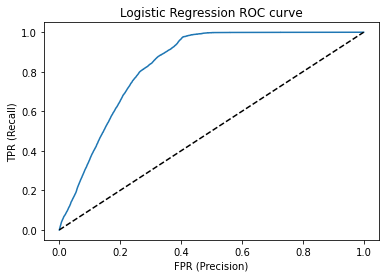

Area under curve (AUC):  0.83416


In [78]:

plt.title('Logistic Regression ROC curve')
plt.xlabel('FPR (Precision)')
plt.ylabel('TPR (Recall)')

plt.plot(fpr_LR, tpr_LR)
plt.plot((0,1), ls='dashed',color='black')
plt.show()
print ('Area under curve (AUC): ', format(round(auc(fpr_LR, tpr_LR),5)))

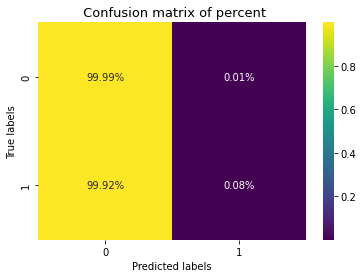

In [79]:
cm = confusion_matrix(y_test, y_pred_LR, normalize='true')
sns.heatmap(cm, robust=True, 
            vmin=cm.min(), vmax=cm.max(), annot=True, 
            cmap='viridis', fmt='.2%') #fmt='.2%'
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title(' Confusion matrix of percent', fontsize=13)
plt.show()

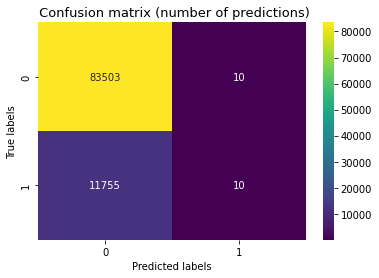

In [80]:
cm = confusion_matrix(y_test, y_pred_LR)
sns.heatmap(cm, robust=True, 
            vmin=cm.min(), vmax=cm.max(), annot=True, 
            cmap='viridis', fmt='n') #fmt='.2%'
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title(' Confusion matrix (number of predictions)', fontsize=13)
plt.show()

In [81]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred_LR))

              precision    recall  f1-score   support

           0       0.88      1.00      0.93     83513
           1       0.50      0.00      0.00     11765

    accuracy                           0.88     95278
   macro avg       0.69      0.50      0.47     95278
weighted avg       0.83      0.88      0.82     95278



# Gaussian

In [82]:
from sklearn.naive_bayes import GaussianNB
from sklearn import metrics


In [83]:
NB_model = GaussianNB()
NB_model.fit(X_train, y_train)

GaussianNB()

In [84]:
y_score_NB = NB_model.predict_proba(X_test)
y_pred_NB = y_score_NB[:, 1] > 0.5
y_pred_NB = y_pred_NB.astype('int')

# evaluation metric
Roc_Auc_score_NB = roc_auc_score(y_test, y_score_NB[:, 1])
f1_NB = f1_score(y_test, y_pred_NB)
precision_NB = precision_score(y_test, y_pred_NB)
recall_NB = recall_score(y_test, y_pred_NB)
fpr_NB, tpr_NB, thresholds_NB = roc_curve(y_test, y_score_NB[:, 1], pos_label=1)

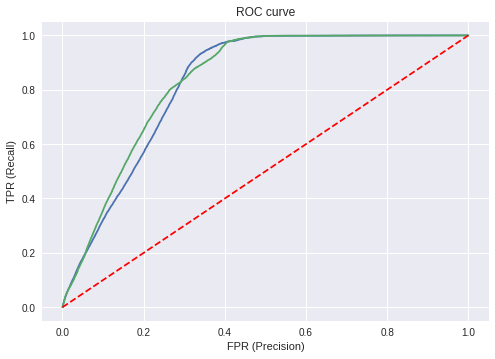

Area under curve (AUC) of LR:  0.83416
Area under curve (AUC) of NB:  0.82456


In [94]:
plt.style.use('seaborn')
plt.title('ROC curve')
plt.xlabel('FPR (Precision)')
plt.ylabel('TPR (Recall)')


plt.plot(fpr_NB, tpr_NB)

plt.plot(fpr_LR, tpr_LR)

plt.plot((0,1), ls='dashed',color='red')
plt.show()
print ('Area under curve (AUC) of LR: ', format(round(auc(fpr_LR, tpr_LR),5)))
print ('Area under curve (AUC) of NB: ', format(round(auc(fpr_NB, tpr_NB),5)))

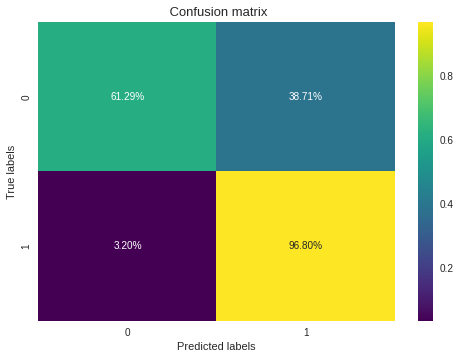

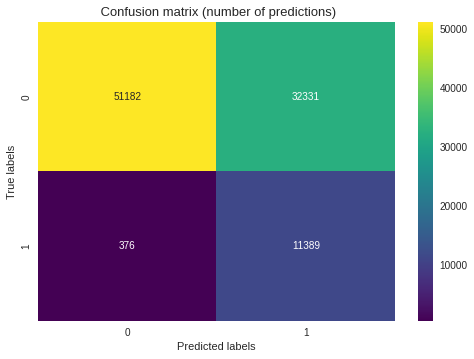

In [86]:
cm = confusion_matrix(y_test, y_pred_NB, normalize='true')
sns.heatmap(cm, robust=True, 
            vmin=cm.min(), vmax=cm.max(), annot=True, 
            cmap='viridis', fmt='.2%') #fmt='.2%'
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title(' Confusion matrix', fontsize=13)
plt.show()



cm = confusion_matrix(y_test, y_pred_NB)
sns.heatmap(cm, robust=True, 
            vmin=cm.min(), vmax=cm.max(), annot=True, 
            cmap='viridis', fmt='n') #fmt='.2%'
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title(' Confusion matrix (number of predictions)', fontsize=13)
plt.show()

In [87]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred_NB))

              precision    recall  f1-score   support

           0       0.99      0.61      0.76     83513
           1       0.26      0.97      0.41     11765

    accuracy                           0.66     95278
   macro avg       0.63      0.79      0.58     95278
weighted avg       0.90      0.66      0.71     95278



# RandomForest

In [88]:
from sklearn.ensemble import RandomForestClassifier


In [89]:
model_RF = RandomForestClassifier()
        
# Parameters tuning
params = {'criterion': ['entropy', 'gini'],
        'max_depth': [3,5,7,8,10],
        'min_samples_leaf': [5, 6, 7, 8],
        'min_samples_split': [6, 7, 8, 10],
        'n_estimators': [100, 200, 300]}

RF_search = RandomizedSearchCV(estimator = model_RF, 
                    param_distributions = params, 
                    n_iter=10, cv=3, 
                    n_jobs=-1, 
                    verbose=1, 
                    random_state=9)

print('Searching params for RF...')
RF_search.fit(X_train, y_train)

print('Best params are:', RF_search.best_params_)
best_params = RF_search.best_params_
model_RF = RandomForestClassifier(**best_params)

Searching params for RF...
Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best params are: {'n_estimators': 300, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_depth': 10, 'criterion': 'gini'}


In [90]:
model_RF.fit(X_train,y_train)

RandomForestClassifier(max_depth=10, min_samples_leaf=5, min_samples_split=10,
                       n_estimators=300)

In [91]:
y_score_RF = model_RF.predict_proba(X_test)
y_pred_RF = y_score_RF[:, 1] > 0.5
y_pred_RF = y_pred_RF.astype('int')

# evaluation metric
Roc_Auc_score_RF = roc_auc_score(y_test, y_score_RF[:,1])
f1_RF = f1_score(y_test, y_pred_RF)
precision_RF = precision_score(y_test, y_pred_RF)
recall_RF = recall_score(y_test, y_pred_RF)
fpr_RF, tpr_RF, thresholds_RF = roc_curve(y_test, y_score_RF[:, 1], pos_label=1)

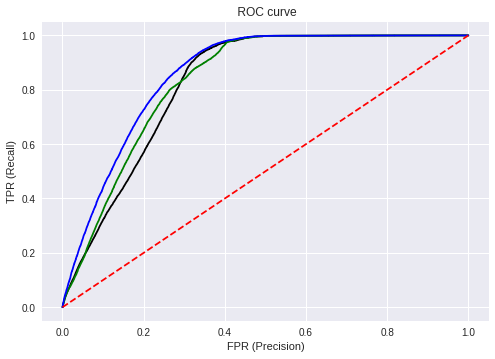

Area under curve (AUC) of LR:  0.83416
Area under curve (AUC) of NB:  0.82456
Area under curve (AUC) of RF:  0.8585


In [95]:
plt.style.use('seaborn')
plt.title(' ROC curve')
plt.xlabel('FPR (Precision)')
plt.ylabel('TPR (Recall)')


plt.plot(fpr_NB, tpr_NB,color = 'black',label='LR')

plt.plot(fpr_LR, tpr_LR , color='green')

plt.plot(fpr_RF, tpr_RF, color='blue')

plt.plot((0,1), ls='dashed',color='red')
plt.show()
print ('Area under curve (AUC) of LR: ', format(round(auc(fpr_LR, tpr_LR),5)))
print ('Area under curve (AUC) of NB: ', format(round(auc(fpr_NB, tpr_NB),5)))
print ('Area under curve (AUC) of RF: ', format(round(auc(fpr_RF, tpr_RF),5)))

In [121]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred_RF))

              precision    recall  f1-score   support

           0       0.88      1.00      0.93     83513
           1       0.40      0.00      0.00     11765

    accuracy                           0.88     95278
   macro avg       0.64      0.50      0.47     95278
weighted avg       0.82      0.88      0.82     95278



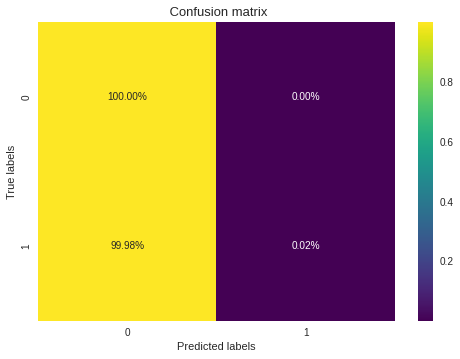

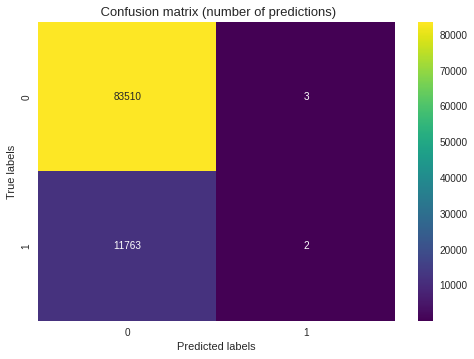

In [122]:
cm = confusion_matrix(y_test, y_pred_RF, normalize='true')
sns.heatmap(cm, robust=True, 
            vmin=cm.min(), vmax=cm.max(), annot=True, 
            cmap='viridis', fmt='.2%') #fmt='.2%'
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title(' Confusion matrix', fontsize=13)
plt.show()



cm = confusion_matrix(y_test, y_pred_RF)
sns.heatmap(cm, robust=True, 
            vmin=cm.min(), vmax=cm.max(), annot=True, 
            cmap='viridis', fmt='n') #fmt='.2%'
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title(' Confusion matrix (number of predictions)', fontsize=13)
plt.show()

In [118]:
before_table = {'Model': ['LR','NB', 'RF'],
                'Precision': [precision_LR,precision_NB, precision_RF],
                'F1_Score': [f1_LR, f1_NB, f1_RF],
                'Recall': [recall_LR, recall_NB, recall_RF],
                'Roc_Auc': [Roc_Auc_score_LR, Roc_Auc_score_NB, Roc_Auc_score_RF]}
before_tuning = pd.DataFrame(before_table)
before_tuning

In [119]:
before_tuning = pd.DataFrame(before_table)

In [120]:
before_tuning

,Model,Precision,F1_Score,Recall,Roc_Auc
0,LR,0.500000,0.001697,0.000850,0.834159
1,NB,0.260499,0.410525,0.968041,0.824559
2,RF,0.400000,0.000340,0.000170,0.858499


# 5.Tuning Model
## 5.1 Chuẩn bị data

In [123]:
from imblearn.over_sampling import RandomOverSampler, SMOTE, SMOTENC
from imblearn.under_sampling import RandomUnderSampler, NearMiss
from imblearn.combine import SMOTEENN, SMOTETomek

In [124]:
sm = SMOTE()
X_train_SM,y_train_SM = sm.fit_resample(X_train, y_train)
X_test_SM, y_test_SM = sm.fit_resample(X_test,y_test)

In [125]:
y_train_SM.value_counts()

0    250886
1    250886
Name: Response, dtype: int64

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



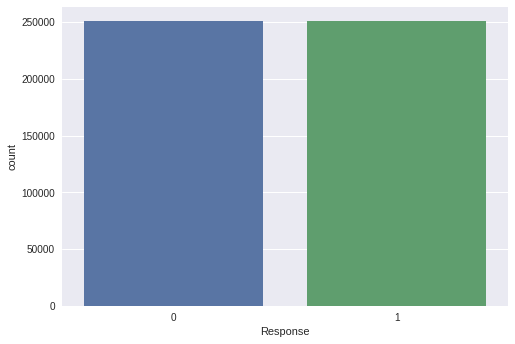

In [126]:
sns.countplot(y_train_SM)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



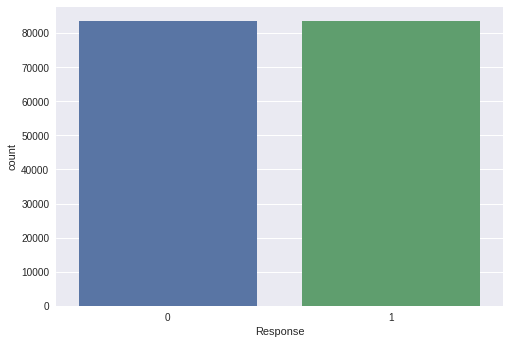

In [127]:
sns.countplot(y_test_SM)

# LR with oversampling

In [98]:
model_LR.fit(X_train_SM,y_train_SM)

NameError: ignored

In [97]:
y_score_LR_SM = model_LR.predict_proba(X_test_SM)
y_pred_LR_SM = y_score_LR_SM[:, 1] > 0.5
y_pred_LR_SM = y_pred_LR_SM.astype('int')

# evaluation metric
Roc_Auc_score_LR_SM = roc_auc_score(y_test_SM, y_score_LR_SM[:, 1])
f1_LR_SM = f1_score(y_test_SM,y_pred_LR_SM )
precision_LR_SM = precision_score(y_test_SM, y_pred_LR_SM )
recall_LR_SM = recall_score(y_test_SM, y_pred_LR_SM )
fpr_LR_SM, tpr_LR_SM, thresholds_LR_SM = roc_curve(y_test_SM, y_score_LR_SM[:, 1] , pos_label=1)

NameError: ignored

In [130]:
Roc_Auc_score_LR_SM

0.8372117420946077

NameError: ignored

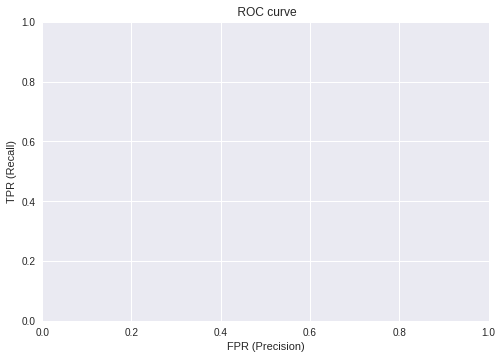

In [96]:
plt.style.use('seaborn')
plt.title(' ROC curve')
plt.xlabel('FPR (Precision)')
plt.ylabel('TPR (Recall)')


#plt.plot(fpr_NB_SM, tpr_NB_SM,color = 'black',label='LR')

plt.plot(fpr_LR_SM, tpr_LR_SM , color='green')

#plt.plot(fpr_RF_SM, tpr_RF_SM, color='blue')

plt.plot((0,1), ls='dashed',color='red')
plt.show()
print ('Area under curve (AUC) of LR: ', format(round(auc(fpr_LR_SM, tpr_LR_SM),5)))
#print ('Area under curve (AUC) of NB: ', format(round(auc(fpr_NB_SM, tpr_NB_SM),5)))
#print ('Area under curve (AUC) of RF: ', format(round(auc(fpr_RF_SM, tpr_RF_SM),5)))

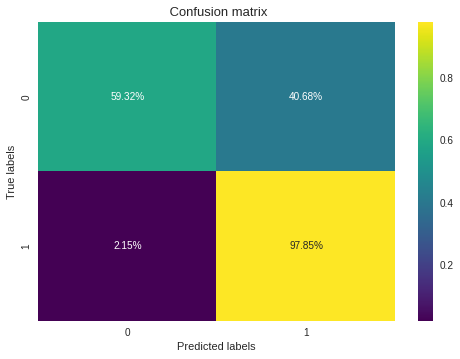

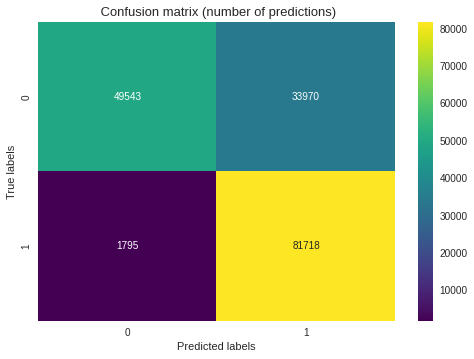

In [132]:
cm = confusion_matrix(y_test_SM, y_pred_LR_SM, normalize='true')
sns.heatmap(cm, robust=True, 
            vmin=cm.min(), vmax=cm.max(), annot=True, 
            cmap='viridis', fmt='.2%') #fmt='.2%'
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title(' Confusion matrix', fontsize=13)
plt.show()



cm = confusion_matrix(y_test_SM, y_pred_LR_SM)
sns.heatmap(cm, robust=True, 
            vmin=cm.min(), vmax=cm.max(), annot=True, 
            cmap='viridis', fmt='n') #fmt='.2%'
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title(' Confusion matrix (number of predictions)', fontsize=13)
plt.show()

# NB

In [133]:
NB_model = GaussianNB()
NB_model.fit(X_train_SM, y_train_SM)

GaussianNB()

In [134]:
y_score_NB_SM = NB_model.predict_proba(X_test_SM)
y_pred_NB_SM = y_score_NB_SM[:, 1] > 0.5
y_pred_NB_SM = y_pred_NB_SM.astype('int')

# evaluation metric
Roc_Auc_score_NB_SM = roc_auc_score(y_test_SM, y_score_NB_SM[:, 1])
f1_NB_SM = f1_score(y_test_SM, y_pred_NB_SM)
precision_NB_SM = precision_score(y_test_SM, y_pred_NB_SM)
recall_NB_SM = recall_score(y_test_SM, y_pred_NB_SM)
fpr_NB_SM, tpr_NB_SM, thresholds_NB_SM = roc_curve(y_test_SM, y_score_NB_SM[:, 1], pos_label=1)

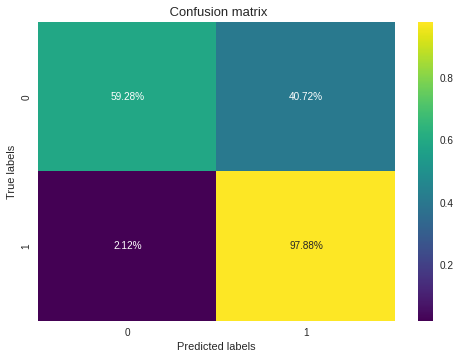

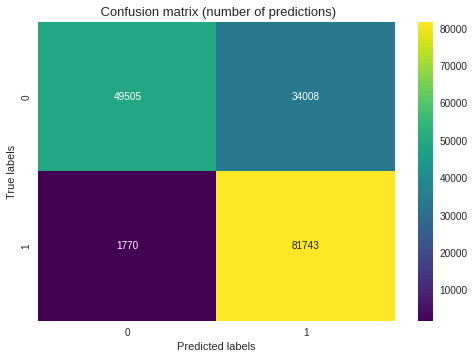

In [136]:
cm = confusion_matrix(y_test_SM, y_pred_NB_SM, normalize='true')
sns.heatmap(cm, robust=True, 
            vmin=cm.min(), vmax=cm.max(), annot=True, 
            cmap='viridis', fmt='.2%') #fmt='.2%'
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title(' Confusion matrix', fontsize=13)
plt.show()



cm = confusion_matrix(y_test_SM, y_pred_NB_SM)
sns.heatmap(cm, robust=True, 
            vmin=cm.min(), vmax=cm.max(), annot=True, 
            cmap='viridis', fmt='n') #fmt='.2%'
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title(' Confusion matrix (number of predictions)', fontsize=13)
plt.show()

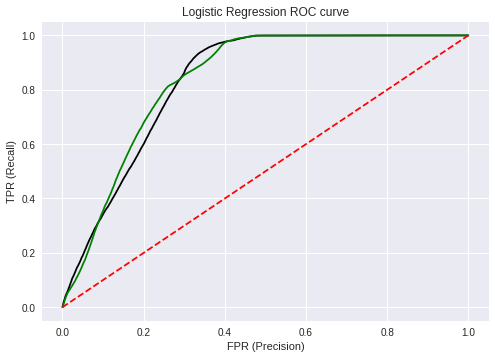

Area under curve (AUC) of LR:  0.83721
Area under curve (AUC) of NB:  0.83254


In [135]:
plt.style.use('seaborn')
plt.title('ROC curve')
plt.xlabel('FPR (Precision)')
plt.ylabel('TPR (Recall)')


plt.plot(fpr_NB_SM, tpr_NB_SM,color = 'black',label='LR')

plt.plot(fpr_LR_SM, tpr_LR_SM , color='green')

#plt.plot(fpr_RF_SM, tpr_RF_SM, color='blue')

plt.plot((0,1), ls='dashed',color='red')
plt.show()
print ('Area under curve (AUC) of LR: ', format(round(auc(fpr_LR_SM, tpr_LR_SM),5)))
print ('Area under curve (AUC) of NB: ', format(round(auc(fpr_NB_SM, tpr_NB_SM),5)))
#print ('Area under curve (AUC) of RF: ', format(round(auc(fpr_RF_SM, tpr_RF_SM),5)))

# Random Forest

In [138]:
model_RF.fit(X_train_SM,y_train_SM)

RandomForestClassifier(max_depth=10, min_samples_leaf=5, min_samples_split=10,
                       n_estimators=300)

In [145]:
y_score_RF_SM = model_RF.predict_proba(X_test_SM)
y_pred_RF_SM = y_score_RF_SM[:, 1] > 0.5
y_pred_RF_SM = y_pred_RF_SM.astype('int')

# evaluation metric
Roc_Auc_score_RF_SM = roc_auc_score(y_test_SM, y_score_RF_SM[:, 1])
f1_RF_SM = f1_score(y_test_SM, y_pred_RF_SM)
precision_RF_SM = precision_score(y_test_SM, y_pred_RF_SM)
recall_RF_SM = recall_score(y_test_SM, y_pred_RF_SM)
fpr_RF_SM, tpr_RF_SM, thresholds_RF_SM = roc_curve(y_test_SM, y_score_RF_SM[:, 1], pos_label=1)

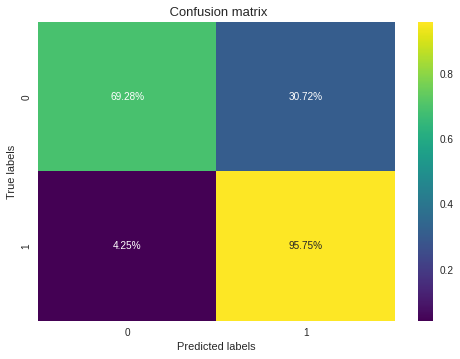

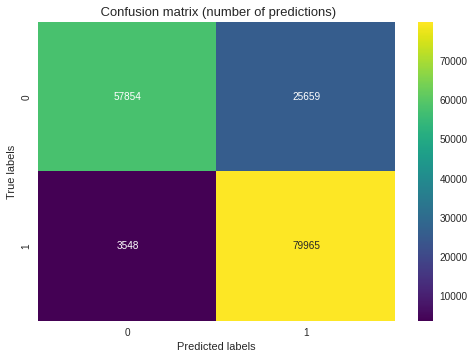

In [141]:
cm = confusion_matrix(y_test_SM, y_pred_RF_SM, normalize='true')
sns.heatmap(cm, robust=True, 
            vmin=cm.min(), vmax=cm.max(), annot=True, 
            cmap='viridis', fmt='.2%') #fmt='.2%'
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title(' Confusion matrix', fontsize=13)
plt.show()



cm = confusion_matrix(y_test_SM, y_pred_RF_SM)
sns.heatmap(cm, robust=True, 
            vmin=cm.min(), vmax=cm.max(), annot=True, 
            cmap='viridis', fmt='n') #fmt='.2%'
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title(' Confusion matrix (number of predictions)', fontsize=13)
plt.show()

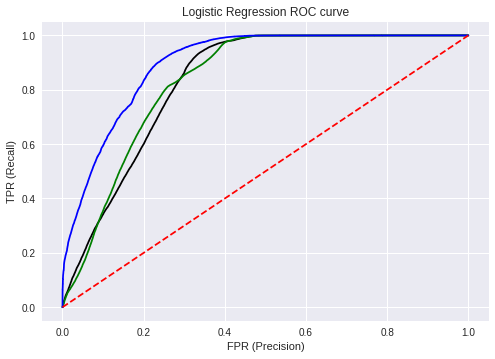

Area under curve (AUC) of LR:  0.83721
Area under curve (AUC) of NB:  0.83254
Area under curve (AUC) of RF:  0.89944


In [146]:
plt.style.use('seaborn')
plt.title('ROC curve')
plt.xlabel('FPR (Precision)')
plt.ylabel('TPR (Recall)')


plt.plot(fpr_NB_SM, tpr_NB_SM,color = 'black',label='LR')

plt.plot(fpr_LR_SM, tpr_LR_SM , color='green')

plt.plot(fpr_RF_SM, tpr_RF_SM, color='blue')

plt.plot((0,1), ls='dashed',color='red')
plt.show()
print ('Area under curve (AUC) of LR: ', format(round(auc(fpr_LR_SM, tpr_LR_SM),5)))
print ('Area under curve (AUC) of NB: ', format(round(auc(fpr_NB_SM, tpr_NB_SM),5)))
print ('Area under curve (AUC) of RF: ', format(round(auc(fpr_RF_SM, tpr_RF_SM),5)))

In [147]:
after_table = {'Model': ['LR_SM','NB_SM', 'RF_SM'],
                'Precision': [precision_LR_SM,precision_NB_SM, precision_RF_SM],
                'F1_Score': [f1_LR_SM, f1_NB_SM, f1_RF_SM],
                'Recall': [recall_LR_SM, recall_NB_SM, recall_RF_SM],
                'Roc_Auc': [Roc_Auc_score_LR_SM, Roc_Auc_score_NB_SM, Roc_Auc_score_RF_SM]}
after_tuning = pd.DataFrame(after_table)
after_tuning

,Model,Precision,F1_Score,Recall,Roc_Auc
0,LR_SM,0.706365,0.820458,0.978506,0.837212
1,NB_SM,0.706197,0.820449,0.978806,0.832544
2,RF_SM,0.757072,0.845578,0.957516,0.899442


In [1]:
after_tuning.set_index('Model')

NameError: ignored

In [2]:
before_tuning.set_index('Model')

NameError: ignored

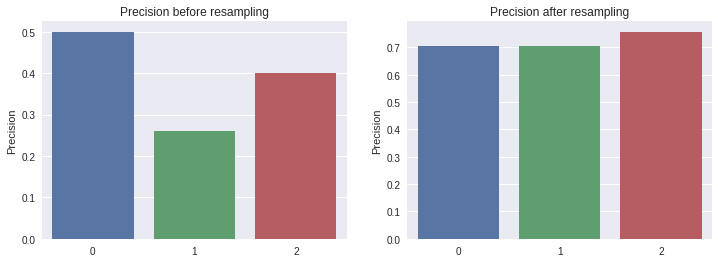

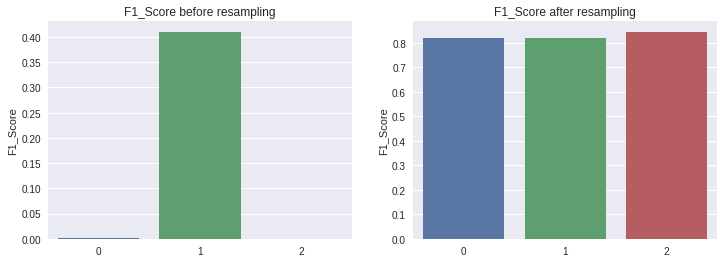

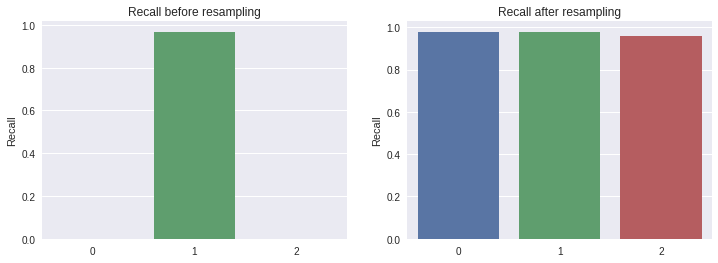

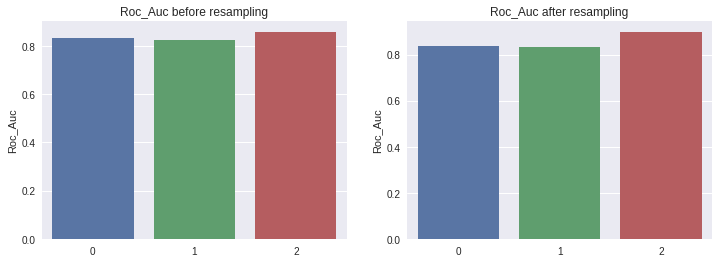

In [151]:
for col in after_tuning.columns.values.tolist()[1:5]:
    fig, ax = plt.subplots(1,2,figsize=(12,4))
    sns.barplot(y=col, x=before_tuning.index, data=before_tuning, ax=ax[0])
    ax[0].set_title(col + ' before resampling')
    
    sns.barplot(y=col, x=after_tuning.index, data=after_tuning, ax=ax[1])
    ax[1].set_title(col + ' after resampling')